## Header

In [56]:
import os
import seaborn as sns
from utils import *
from prody import *

os.chdir('/home/fangyuan/projects/hic/codes')
sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=1, color_codes=True)
colors = sns.color_palette('deep')

In [4]:
import os
os.chdir('/home/fangyuan/hic/codes')

from utils import *
from prody import * # hic conda env: prody uptodate from git: v1.11 
from hicparsers import parseBulkMap

# calc overlap from GNM
# calc gnm
resol = '50kb'
binsize = resol2bin(resol)
# chroms = [str(i) for i in range(1,23)] + ['X', 'Y']
chroms = ['16']

# for sp in ['02','03','04','05','06','51']:
for f in ['untreated.txt']:
    sp = f.strip('.txt')
    for chrom in chroms:
        # if not os.path.isfile(f'../data/GNM/mcf7_{sp}.chr{chrom}.{resol}.sqrtvc.gnm.npz'):
            fpath = f'../data/contact/t47d/{f}' # from unbalanced cool files
            try:
                M, bin = parseBulkMap(fpath, chroms=chrom, bin=binsize)

                hic = HiC('population', M, bin) # prody.chromatin.hic
                hic.normalize(method=VCnorm)

                hic.masked = True
                
                gnm = hic.calcGNM(zeros=True)  
                gnm.masked = False
                gnm.fixTail(M.shape[0]) # add zeros at tail to make length == chrom length
                saveModel(gnm, f'../data/GNM/t47d_{sp}.chr{chrom}.{resol}.vc.gnm.npz', matrices=True)
                print(f'Done for {sp} chr{chrom}')
            except:
                print(f'Failed for {sp} chr{chrom}')

@> 1575 modes were calculated in 0.40s.


Done for untreated chr16


In [72]:
conditions = ['NT','1hr','4hrs','16hrs','24hrs', 'TamR']
files = ['02','03','04','05','06','51']
binsize = 50000
chrom = '16'

gnm_paths = {conditions[i]: f'../data/GNM/mcf7_{files[i]}.chr{chrom}.{binsize//1000}kb.vc.gnm.npz' for i in range(len(files))}  

gnms = {
    cond: loadModel(gnm_paths[cond]) for cond in conditions
}


## Before matching

In [74]:
f = np.load(f'../data/cool_eig/mcf7.{binsize//1000}kb.eigs.npz')
f.files 

['eigs', 'lam']

In [ ]:
tmp = eigs['No Treatment']
E1 = tmp[tmp['chrom']=='16']['E1'].fillna(0).values 
print(len(E1))
E1 

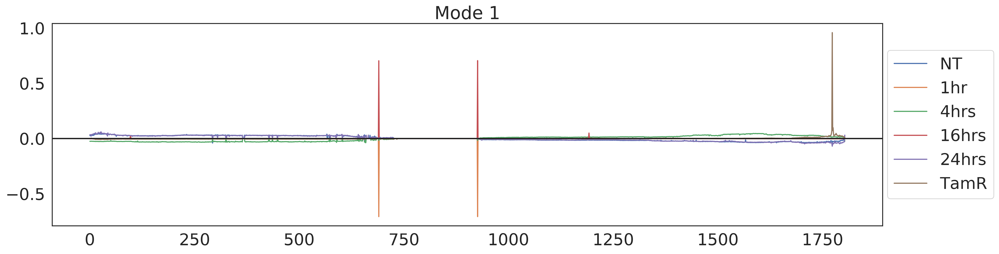

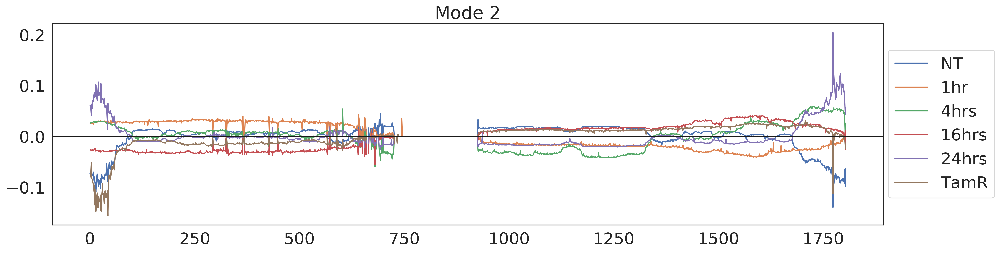

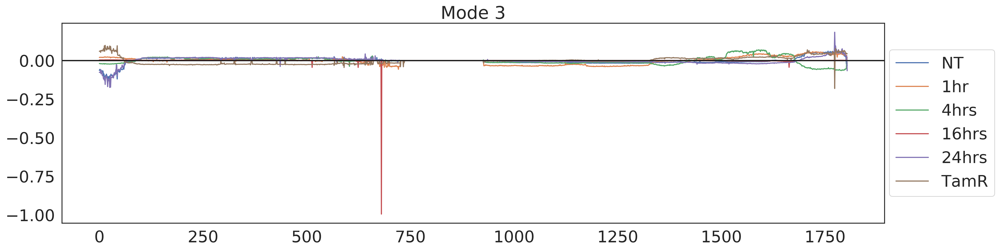

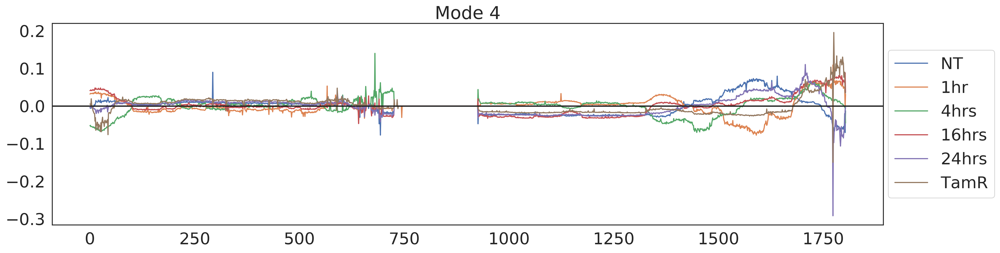

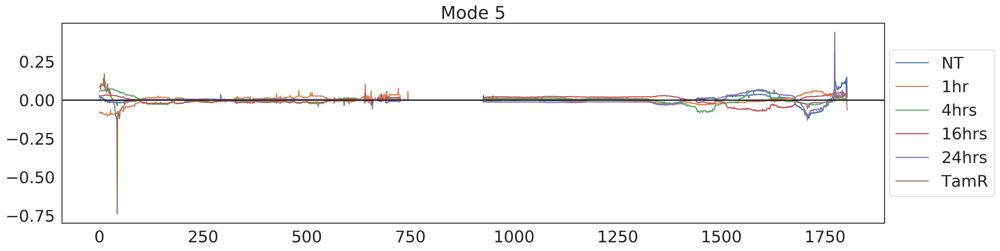

...

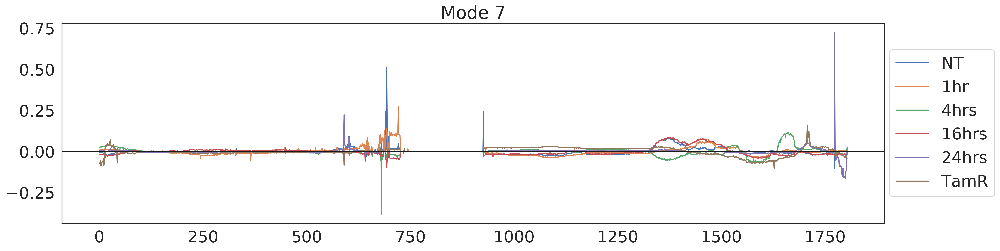

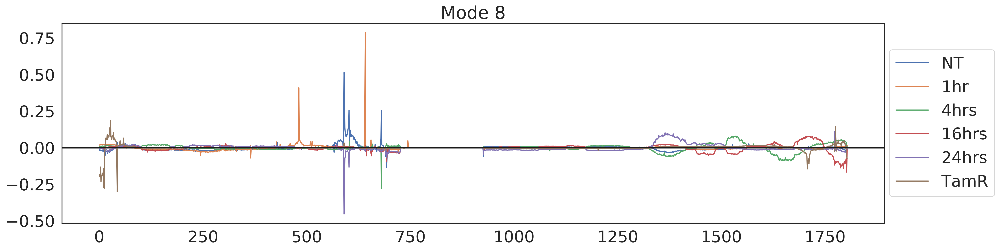

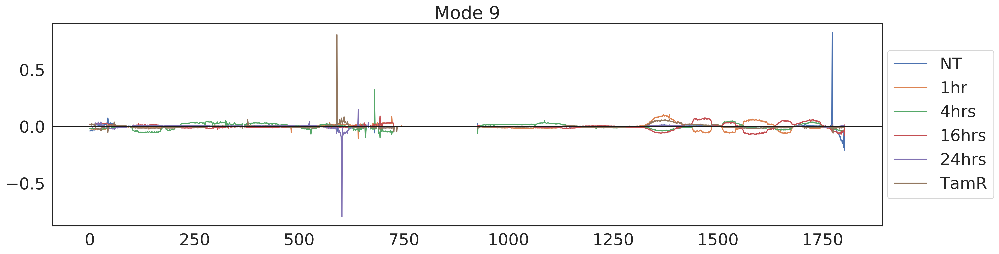

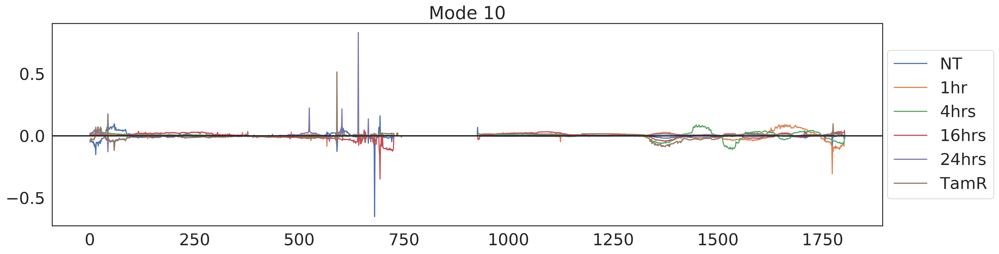

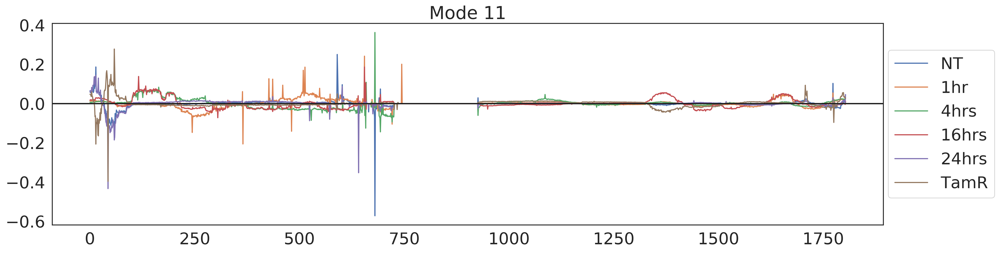

In [73]:
# domains = calcGNMDomains(gnm[:100], dummy_mode=False, linear=True)
# showDomainBar(domains, loc=0., absolute=True, text=False)

sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=2, color_codes=True)


for i in range(1,12):
    plt.figure(figsize=(20,5), dpi=300)
    for k, cond in enumerate(conditions):
        Eig = gnms[cond].getEigvecs()[:,i]
        plt.plot(Eig, c=colors[k], label=cond)
        plt.legend(loc='center', bbox_to_anchor=(1.07, 0.5))
        plt.axhline(y=0, c='k')
        plt.title(f'Mode {i}')

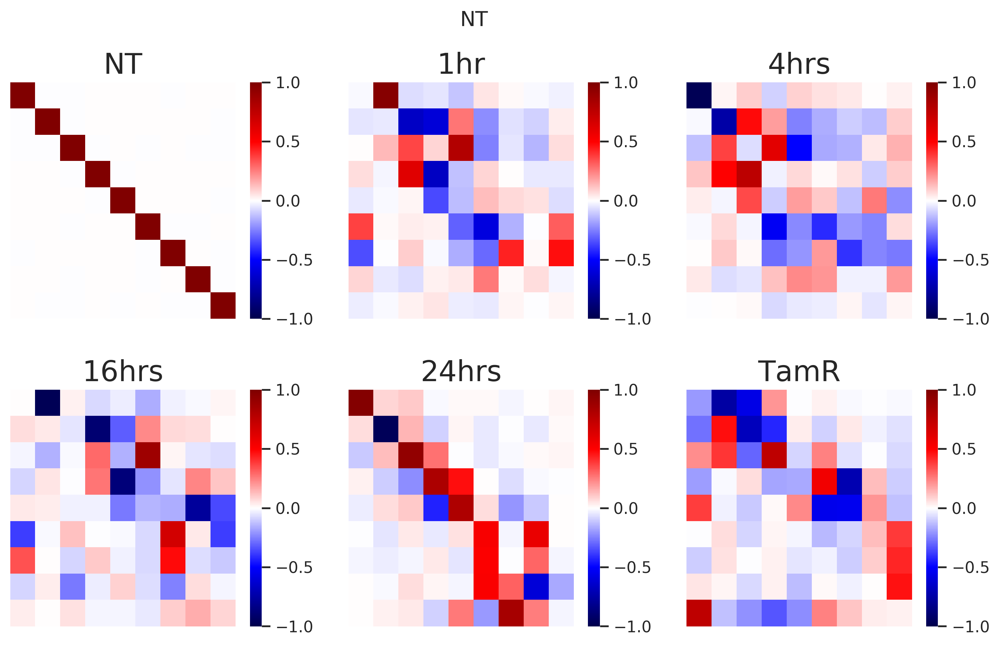

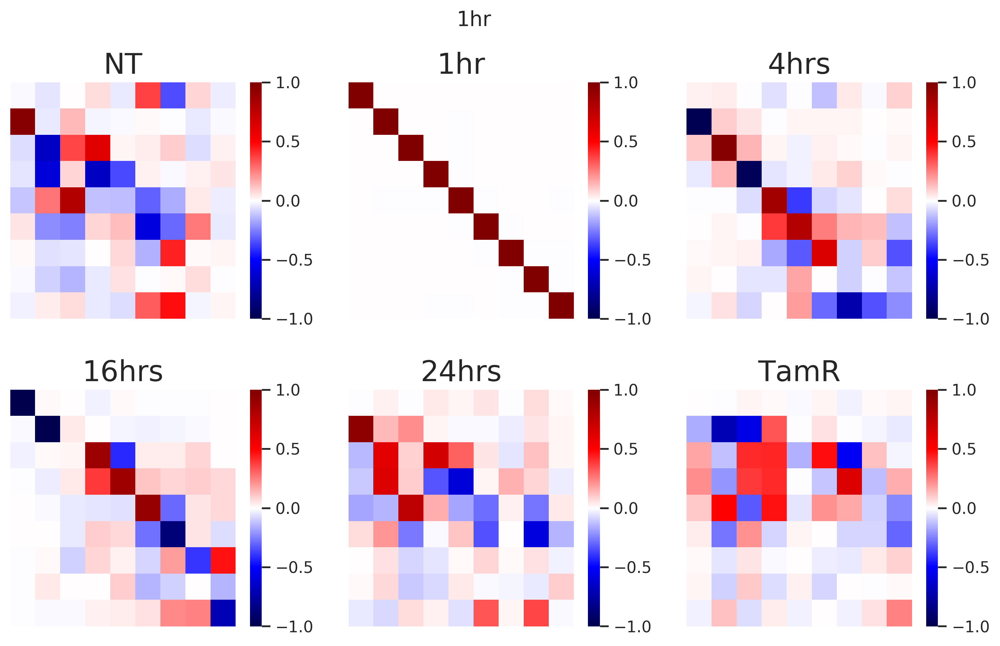

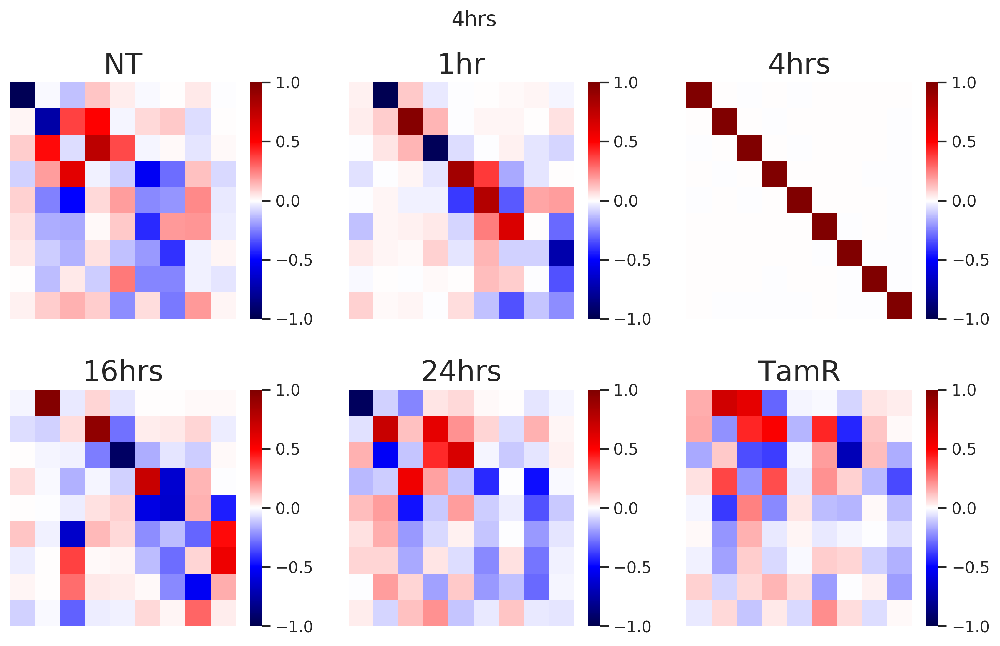

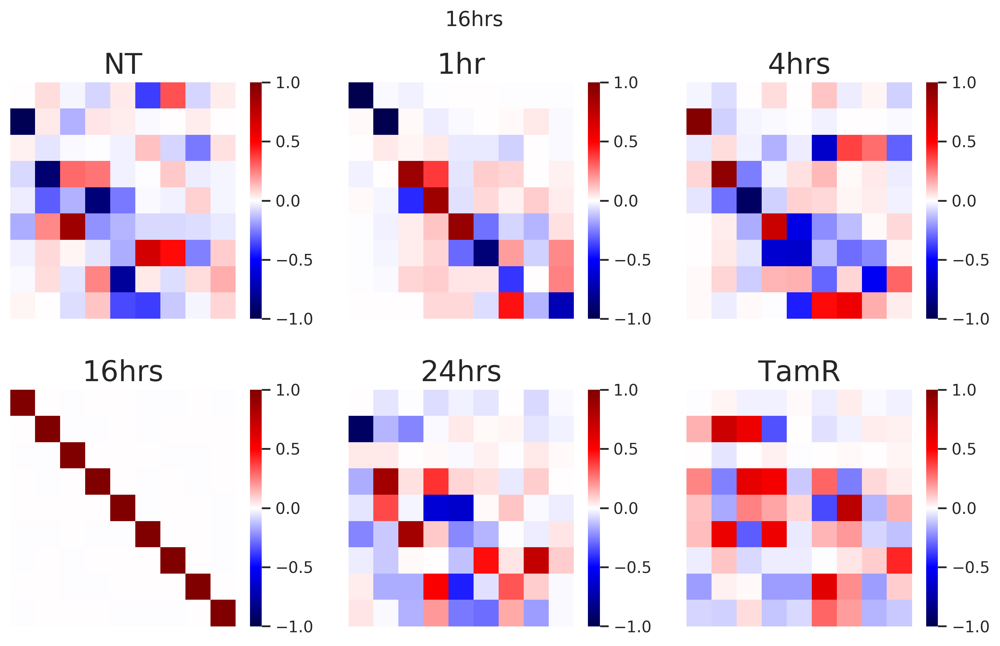

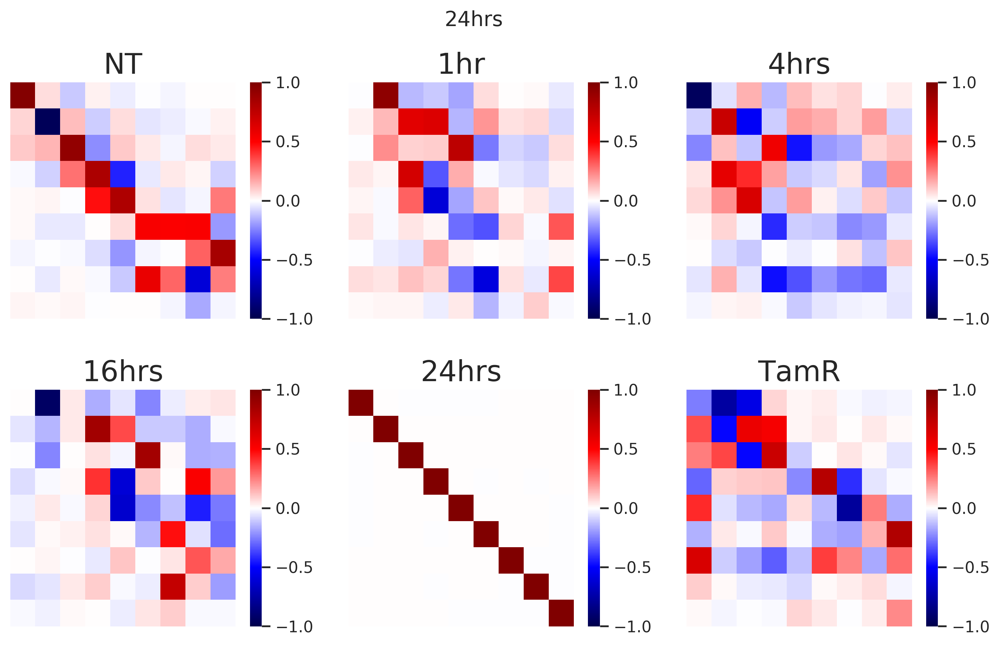

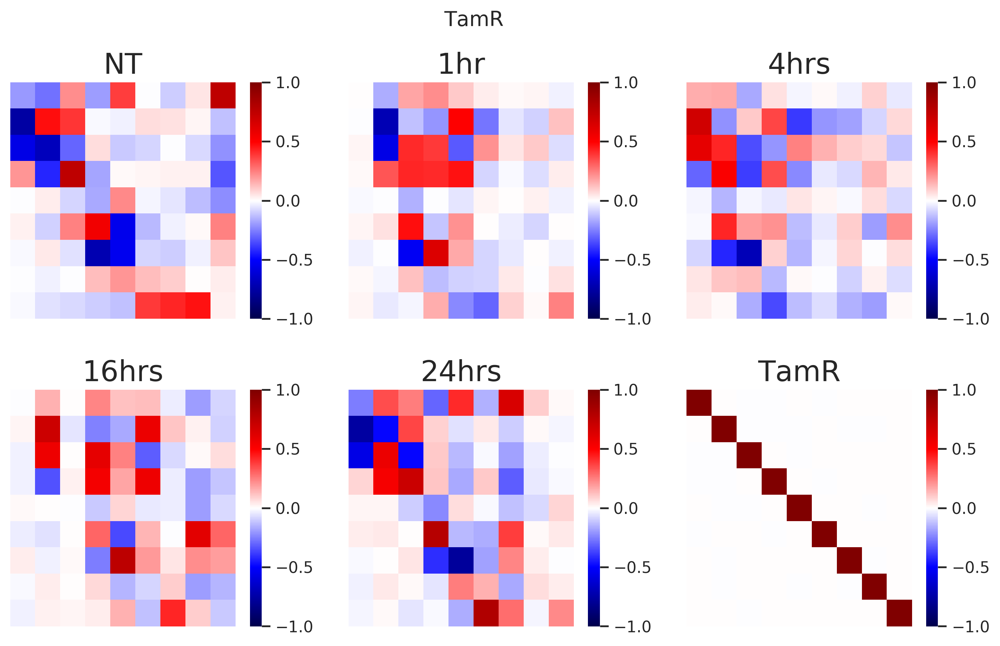

In [52]:
n_modes = 10

nplots = len(conditions)
ncols = 3
nrows = ceil(nplots/ncols)

for ref_cond in conditions:
    gnm_ref = gnms[ref_cond]

    fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*4, nrows*3.5), dpi=300)
    plt.subplots_adjust(wspace=0.2, hspace=0.3) # 
    axes_list = axes.flatten()

    for i, cond in enumerate(conditions):
        ax = axes_list[i]
        R = calcOverlap(gnm_ref[1:n_modes], gnms[cond][1:n_modes])

        sns.heatmap(R, cmap='seismic', vmin=-1, vmax=1, ax=ax)
        ax.set_xticklabels('')
        ax.set_yticklabels('')
        ax.set_title(cond, fontsize=20)
    plt.suptitle(ref_cond)

## After matching

In [34]:
mode_ens = ModeEnsemble('chr16')
for key, gnm in gnms.items():
    mode_ens.addModeSet(gnm[:n_modes], weights=np.array(gnm.mask, dtype=float), label=key)
mode_ens.match()

@> 50 modes across 6 modesets were matched in 0.03s.


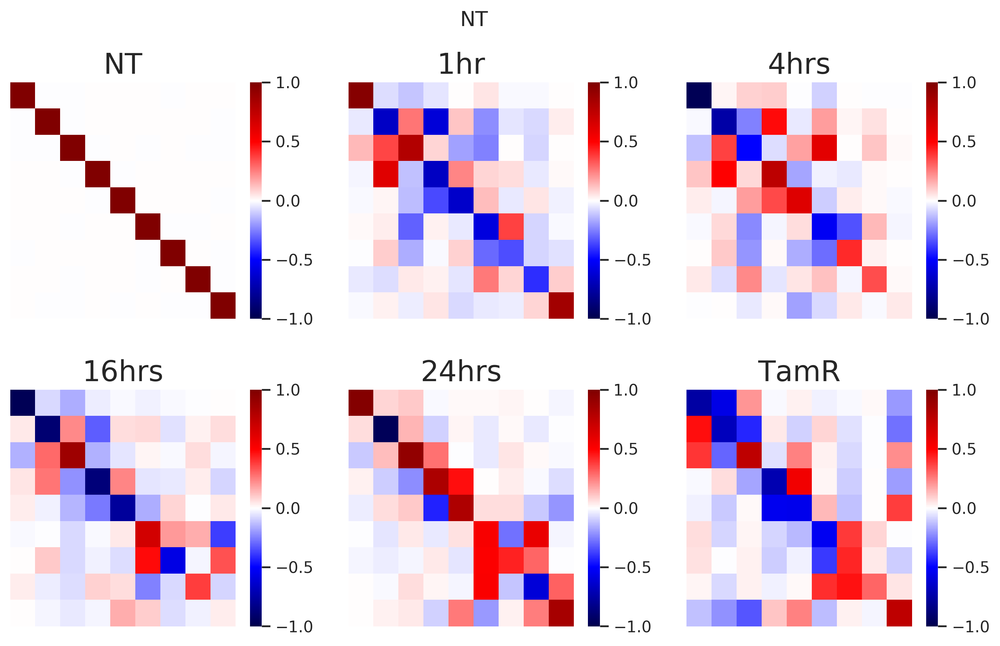

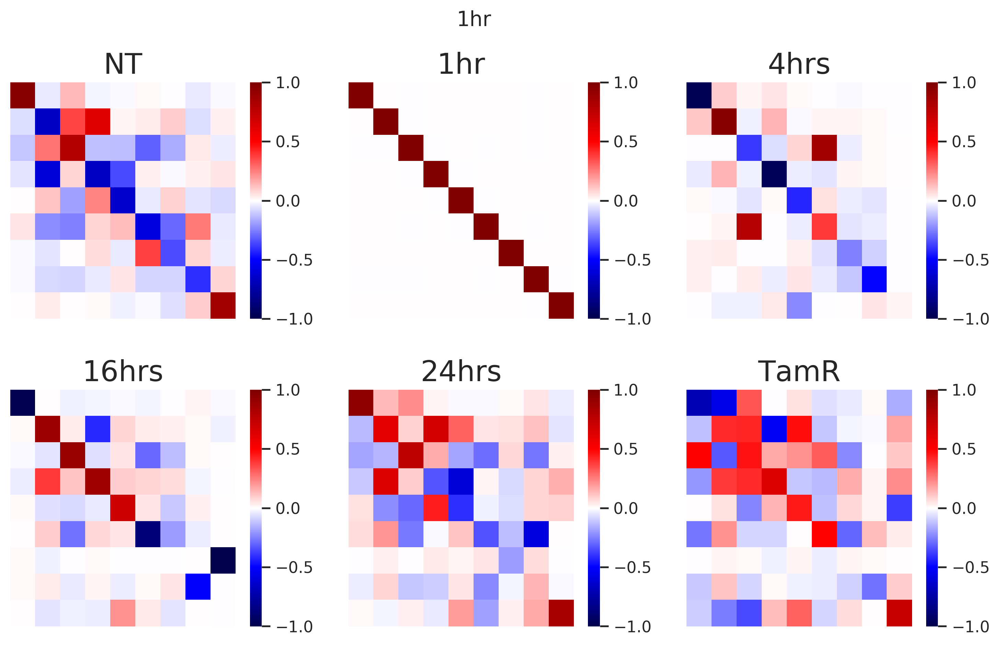

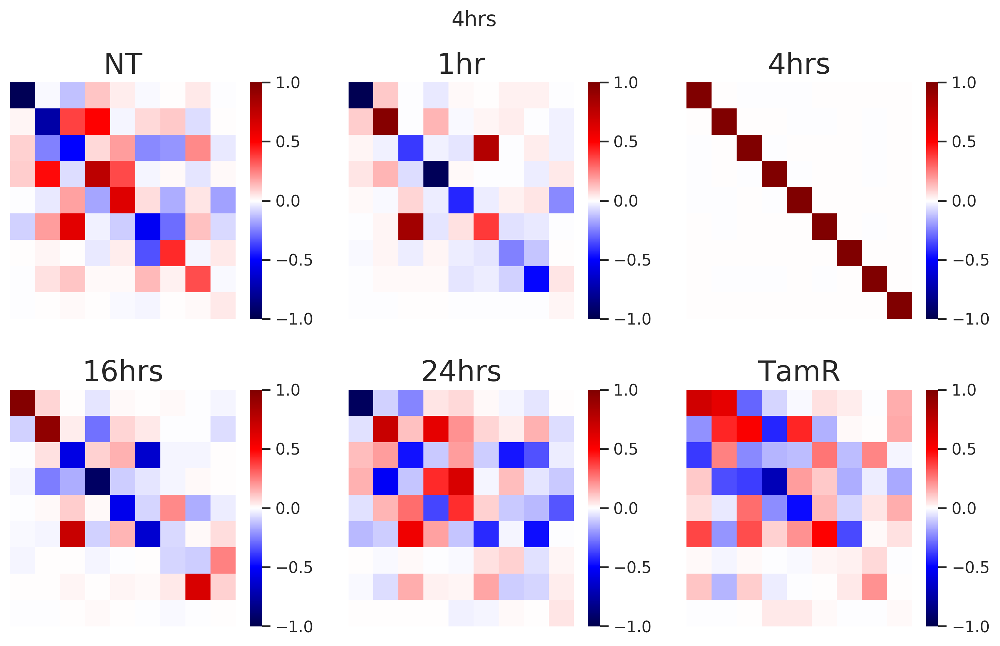

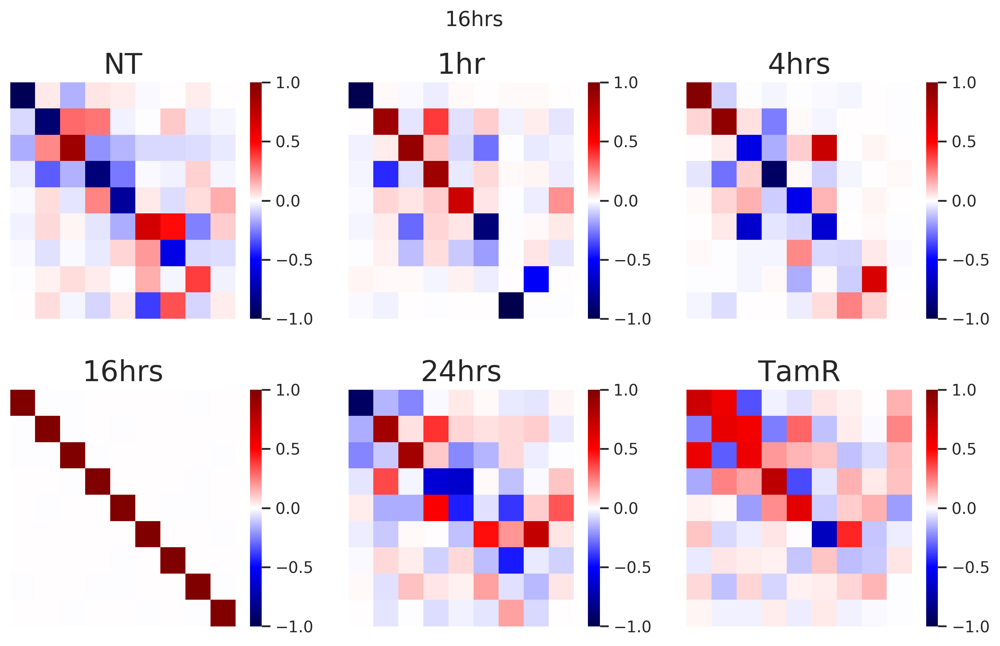

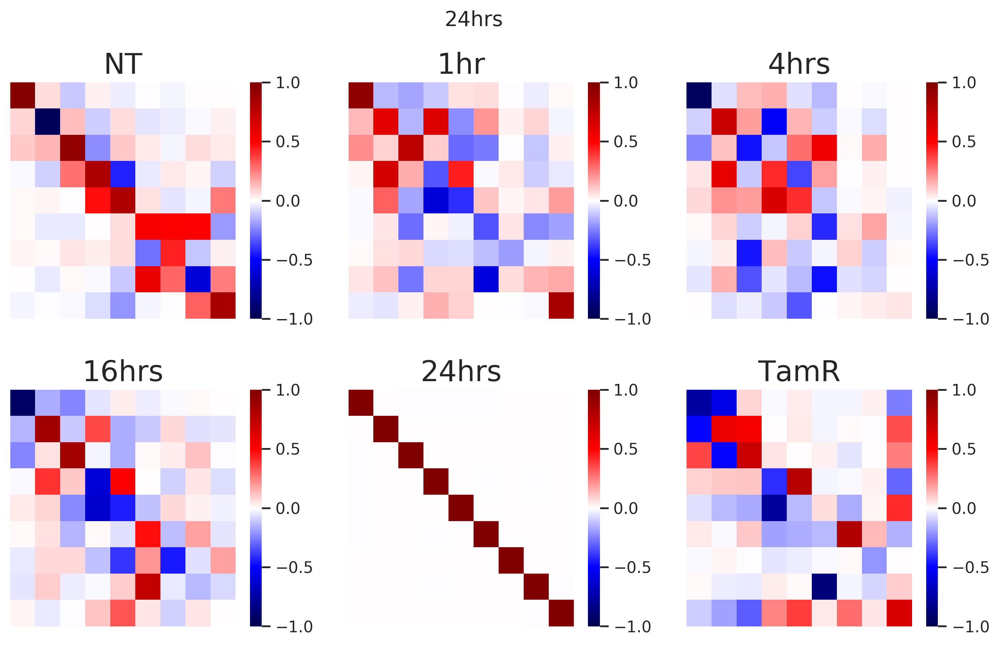

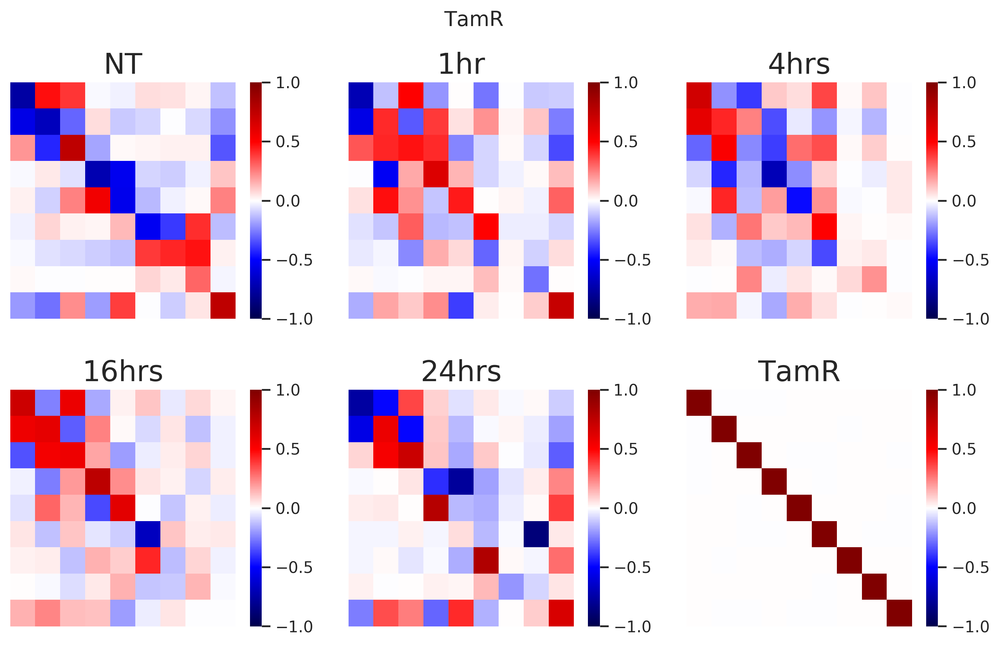

In [55]:
n_modes = 10

nplots = len(conditions)
ncols = 3
nrows = ceil(nplots/ncols)

for r, ref_cond in enumerate(conditions):
    gnm_ref = mode_ens[r, 1:n_modes] #

    fig, axes = plt.subplots(ncols=ncols, nrows=nrows, figsize=(ncols*4, nrows*3.5), dpi=300)
    plt.subplots_adjust(wspace=0.2, hspace=0.3) 
    axes_list = axes.flatten()

    for i, cond in enumerate(conditions):
        ax = axes_list[i]
        R = calcOverlap(gnm_ref, mode_ens[i, 1:n_modes]) #

        sns.heatmap(R, cmap='seismic', vmin=-1, vmax=1, ax=ax)
        ax.set_xticklabels('')
        ax.set_yticklabels('')
        ax.set_title(cond, fontsize=20)
    plt.suptitle(ref_cond)

In [61]:
Eig.getArray()

array([0.08895517, 0.08736245, 0.09273975, ..., 0.02211717, 0.04195078,
       0.04656218])

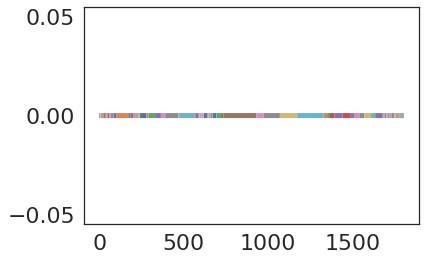

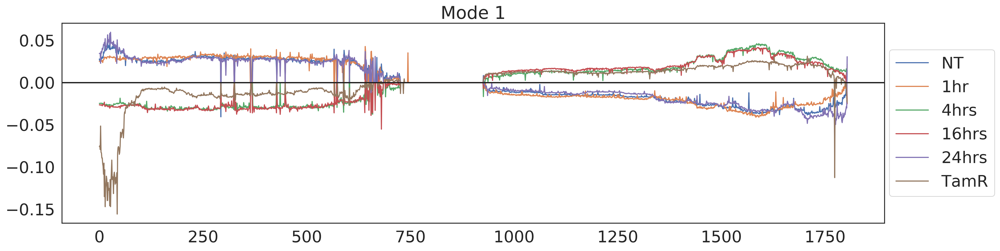

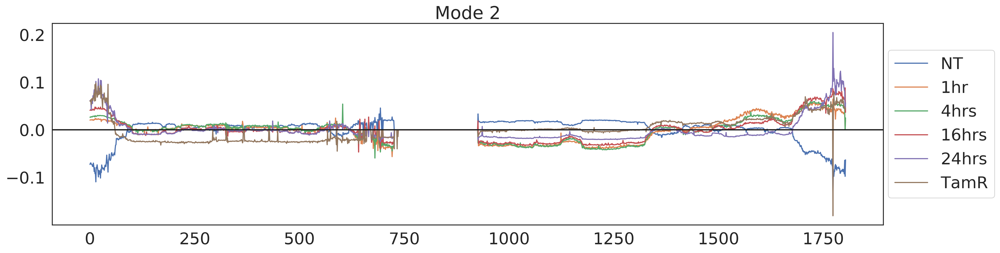

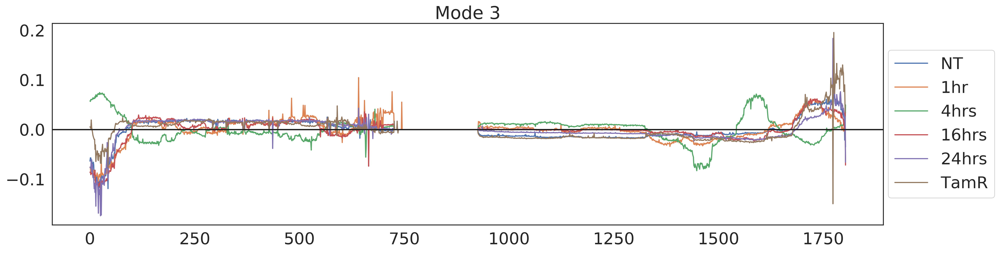

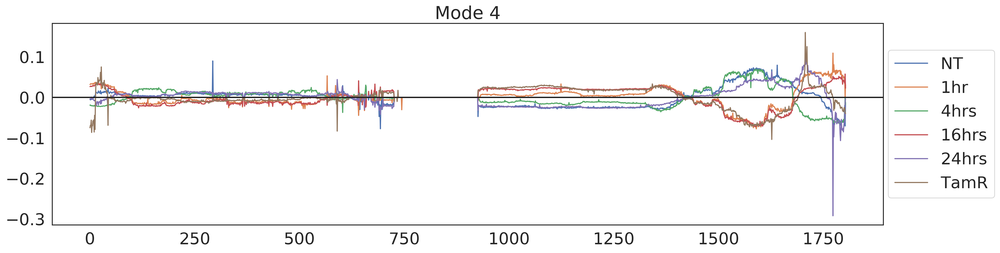

...

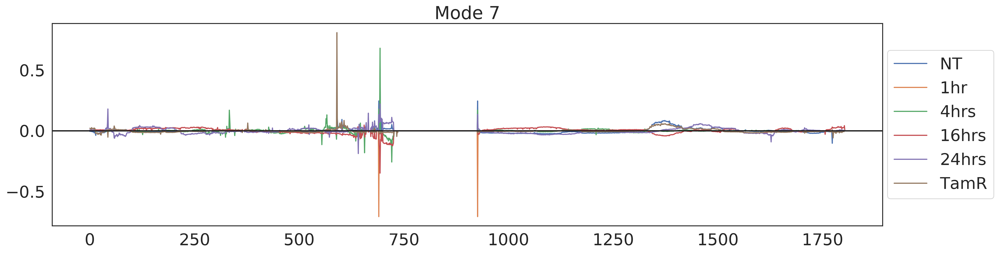

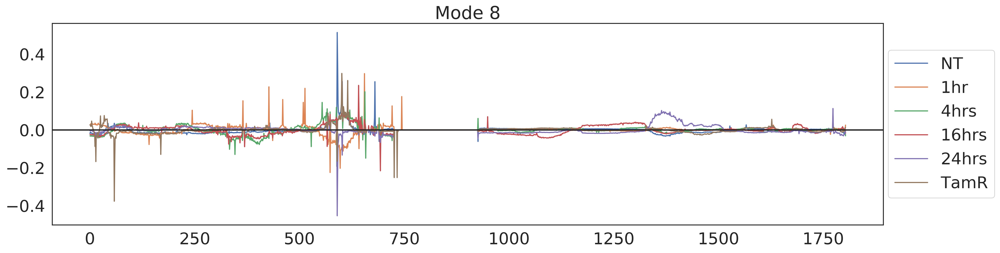

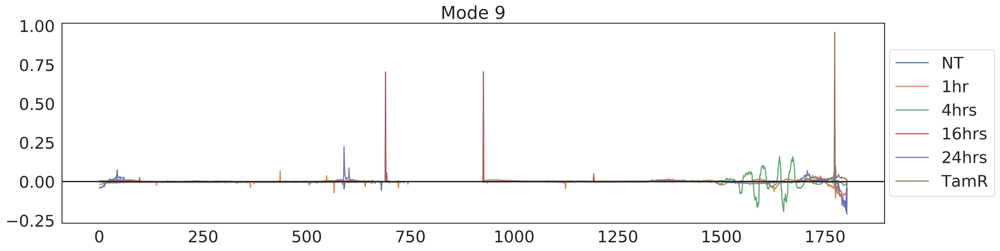

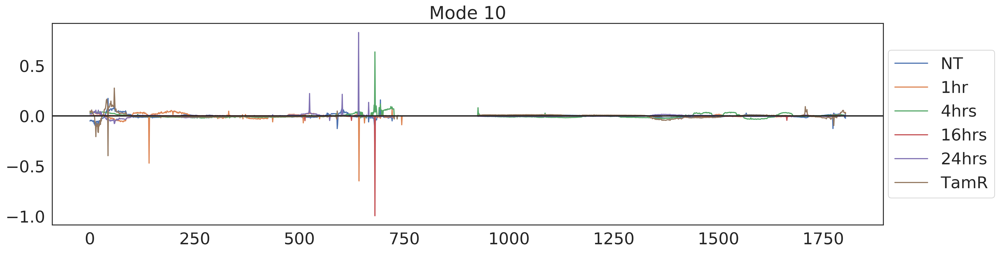

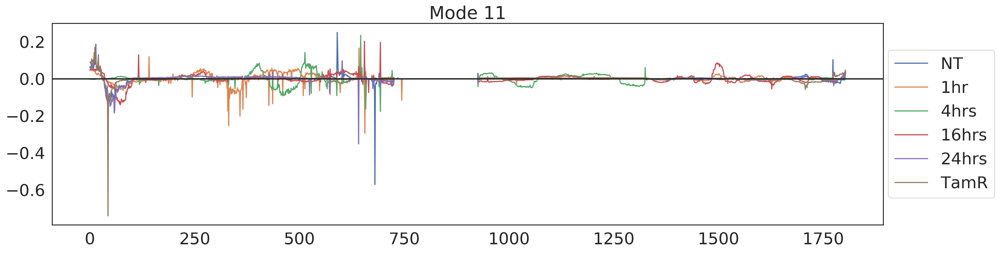

In [68]:
# domains = calcGNMDomains(gnm[:100], dummy_mode=False, linear=True)
sns.set(context='notebook', style='white', palette='deep', font='sans-serif', font_scale=2, color_codes=True)

showDomainBar(domains, loc=0., absolute=True, text=False)

for i in range(1,12):
    plt.figure(figsize=(20,5), dpi=300)
    for k, cond in enumerate(conditions):
        Eig = mode_ens[k, i].getArray()
        plt.plot(Eig, c=colors[k], label=cond)
        plt.legend(loc='center', bbox_to_anchor=(1.07, 0.5))
        plt.axhline(y=0, c='k')
        plt.title(f'Mode {i}')

In [35]:
mode_ens.getLabels()

['NT', '1hr', '4hrs', '16hrs', '24hrs', 'TamR']

In [36]:
mode_ens.getIndices()

sdarray([[ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15,
          16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31,
          32, 33, 34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47,
          48, 49],
         [ 0,  2,  3,  5,  4, 10,  6,  1, 17, 20, 30, 31,  9, 19, 48, 11,
          12, 43,  7, 44, 23, 13, 34, 45, 26,  8, 15, 36, 21, 40, 47, 25,
          16, 14, 46, 22, 24, 42, 35, 27, 18, 39, 41, 38, 32, 33, 28, 37,
          29, 49],
         [ 0,  1,  2,  5,  3, 12,  4, 41, 18, 42,  6, 38,  8, 32, 49,  9,
           7, 15, 44, 30, 17, 11, 10, 43, 19, 13, 14, 35, 48, 31, 37, 40,
          24, 16, 39, 46, 22, 45, 27, 21, 33, 36, 34, 29, 25, 23, 26, 28,
          20, 47],
         [ 0,  2,  4,  6,  5,  8,  7, 10, 18,  1,  3, 25,  9, 17, 16, 13,
          12, 27, 23, 22, 19, 11, 15, 49, 24, 34, 14, 35, 30, 26, 48, 41,
          21, 31, 33, 39, 44, 36, 45, 29, 46, 38, 32, 42, 37, 40, 43, 20,
          28, 47],
         [ 0,  1,  2,  3,  4,  5,  6

In [26]:
# python namespace
np.__spec__.parent

'numpy'

In [44]:
R = calcOverlap(mode_ens[0, :n_modes], mode_ens[1, :n_modes])

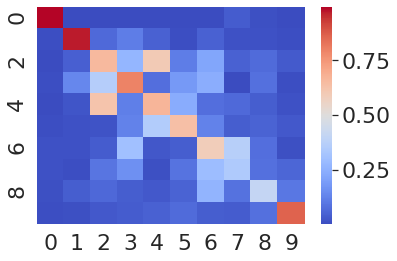

In [45]:
sns.heatmap(abs(R), cmap='coolwarm')